In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import RepeatedKFold
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
from sklearn.kernel_ridge import KernelRidge
from scipy import stats
import statsmodels.api as sm

import pandas as pd
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs

In [2]:
# Bigger cells for readability
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
display(HTML("<style>div.output_scroll {height: 80em; }</style>"))

# Load the Data Frame

### We chose to drop the values of 500,000 dollars or greater from the dataframe after testing and discovering this improved our regressions across the board. It also just doesn't make sense blending a continuous variable with a categorical denomination where all values greater than 500,000 are lumped into the same value. 

In [3]:
dataset = fetch_california_housing(as_frame=True)
df = dataset.frame
dfabove = df[df['MedHouseVal']>=5]
df = df[df['MedHouseVal']<5]
print(dataset.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block
        - HouseAge      median house age in block
        - AveRooms      average number of rooms
        - AveBedrms     average number of bedrooms
        - Population    block population
        - AveOccup      average house occupancy
        - Latitude      house block latitude
        - Longitude     house block longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
http://lib.stat.cmu.edu/datasets/

The target variable is the median house value for California districts.

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bur

# Generate Pandas Profiling Report

In [4]:
prof = ProfileReport(df, title = "California Housing Data Set")
prof
#prof.to_file(
#    output_file="Jackson_Baker_Assignment7_Report.html"
#)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# getting geometric data for geographic plotting
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
# grabbing california map
cali = gpd.read_file(gplt.datasets.get_path('california_congressional_districts'))

In [6]:
df.drop('geometry', axis=1,inplace=True)

C:\Users\mucha\anaconda3\envs\geo_env\lib\site-packages\pandas\core\frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


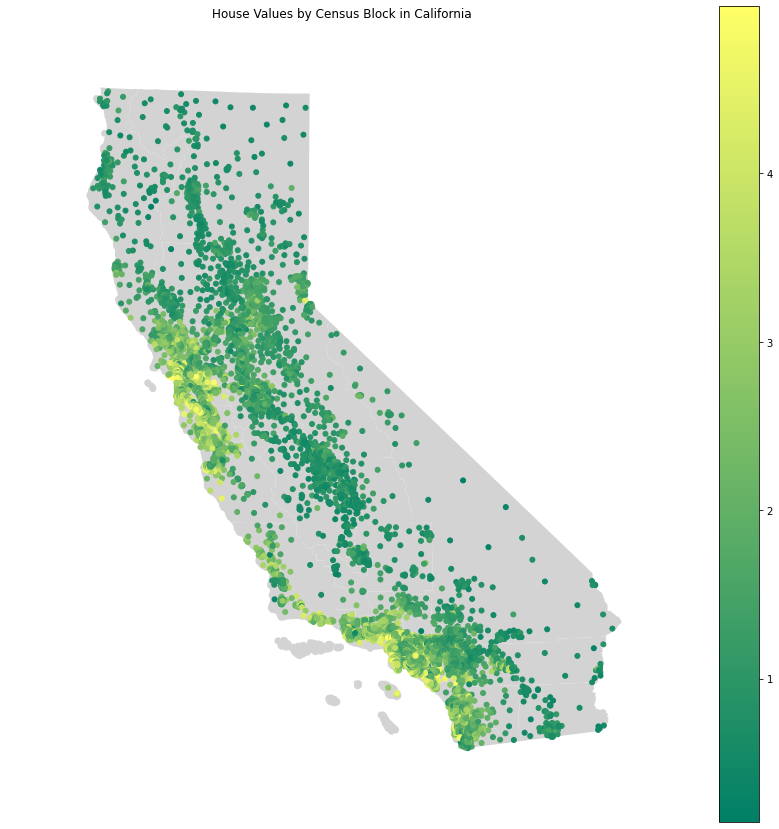

In [7]:
ax = gplt.polyplot(
    cali, projection=gcrs.AlbersEqualArea(),
    edgecolor='None', facecolor='lightgray',
    figsize=(15,15)
)
ax.set_title('House Values by Census Block in California')
gplt.pointplot(
    gdf[gdf['MedHouseVal'].notnull()],
    hue='MedHouseVal', ax=ax, legend=True,
    cmap='summer'
);


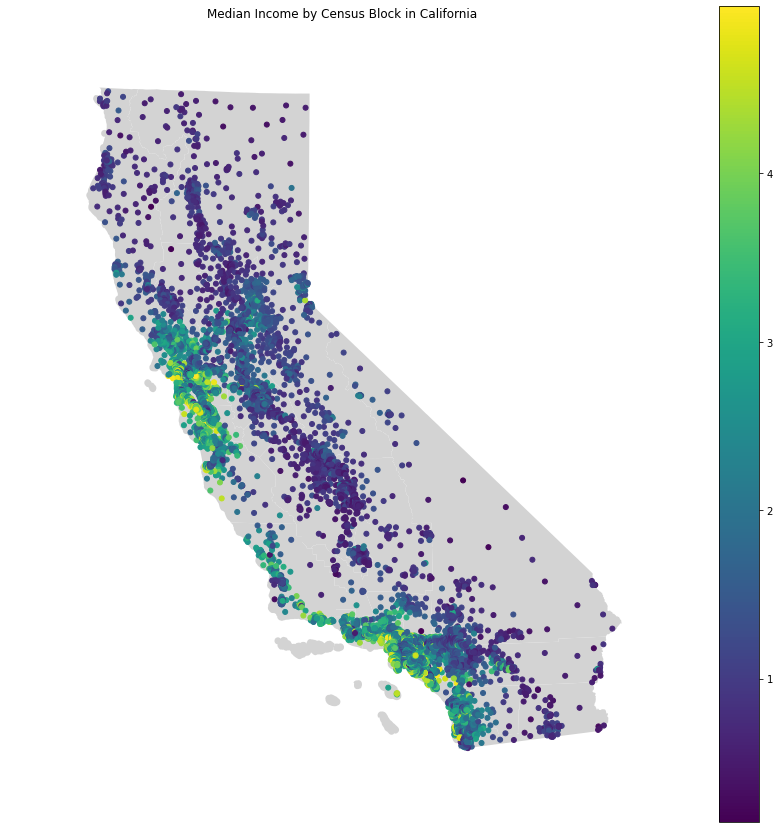

In [8]:
ax = gplt.polyplot(
    cali, projection=gcrs.AlbersEqualArea(),
    edgecolor='None', facecolor='lightgray',
    figsize=(15,15)
)
ax.set_title('Median Income by Census Block in California')
gplt.pointplot(
    gdf[gdf['MedInc'].notnull()],
    hue='MedHouseVal', ax=ax, legend=True,
    cmap='viridis'
);


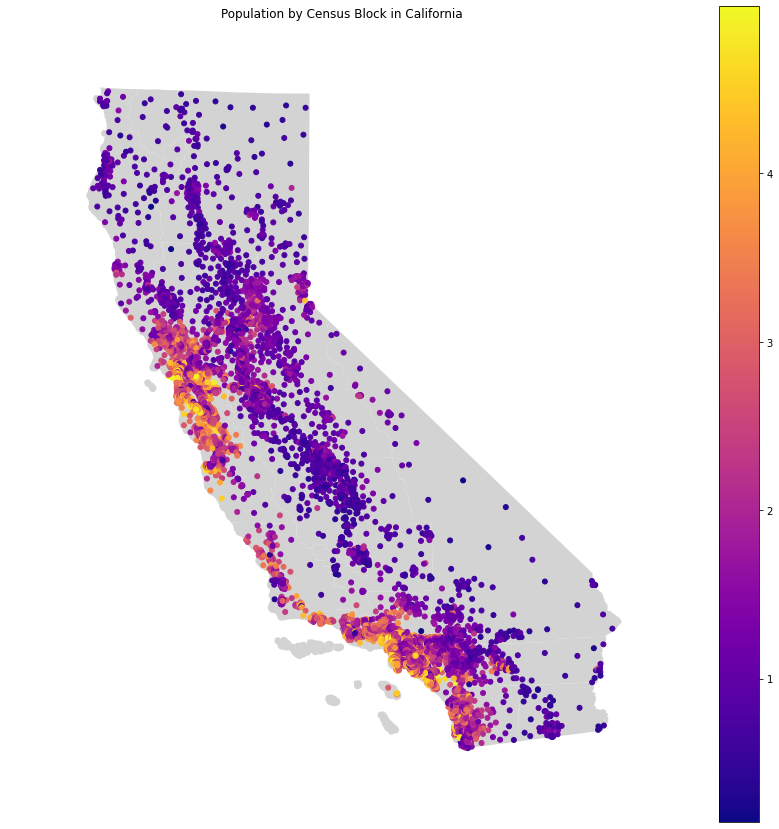

In [9]:
ax = gplt.polyplot(
    cali, projection=gcrs.AlbersEqualArea(),
    edgecolor='None', facecolor='lightgray',
    figsize=(15,15)
)
ax.set_title('Population by Census Block in California')
gplt.pointplot(
    gdf[gdf['MedInc'].notnull()],
    hue='MedHouseVal', ax=ax, legend=True,
    cmap='plasma'
);


# Review Statistical Properties of the Data

In [10]:
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,19648.000000,19648.000000,19648.000000,19648.000000,19648.000000,19648.000000,19648.000000,19648.000000,19648.000000
mean,3.676411,28.373066,5.361708,1.096621,1441.368485,3.096560,35.651872,-119.562378,1.920553
std,1.570602,12.504050,2.293321,0.452136,1144.075196,10.639195,2.150066,2.005760,0.971109
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.526300,18.000000,4.416667,1.005882,796.000000,2.446614,33.930000,-121.760000,1.164750
50%,3.449050,28.000000,5.185730,1.048576,1179.000000,2.837779,34.270000,-118.500000,1.736000
75%,4.582500,37.000000,5.971083,1.099222,1746.250000,3.306021,37.730000,-117.990000,2.479000
max,15.000100,52.000000,132.533333,34.066667,35682.000000,1243.333333,41.950000,-114.310000,4.991000


### Here we immediately notice some glaring outliers, such as the maximum values for AveOccup, Population, AveBedrms, and AveRooms. Some of these values seem impossibly improbable, or potential typographic errors. Because of this we will remove all outliers with a z-score higher than 10 (extremely high) 

In [11]:
z_scores = stats.zscore(df.drop('MedHouseVal', axis=1))
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 10).all(axis=1)
trimmed_df = df[filtered_entries]
trimmed_df.describe()
trimmed_df = df

In [12]:
print(len(df))
print(len(trimmed_df))

19648
19648


### This outlier removal only removed 48 values, leaving us still with the vast majority of our data intact and only very extreme and improbably outliers removed. 

# Check for Missing Values

In [13]:
df.isna().sum()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64

### No missing values present

# Check for Values That Don't Make Sense

In [14]:
df[df<=0].count()

MedInc             0
HouseAge           0
AveRooms           0
AveBedrms          0
Population         0
AveOccup           0
Latitude           0
Longitude      19648
MedHouseVal        0
dtype: int64

### All values make sense

# Ordinary Least Squares Regression -----------------------------------------------------------

### The goal of this regression is to set a benchmark to compare with other regression techniques. I am going to take the variable which has the clearest linear relationship with Median House Value (per the pandas profiling report, that is Median Income), perform a basic OLS regression, and calculate the root mean squared error. 

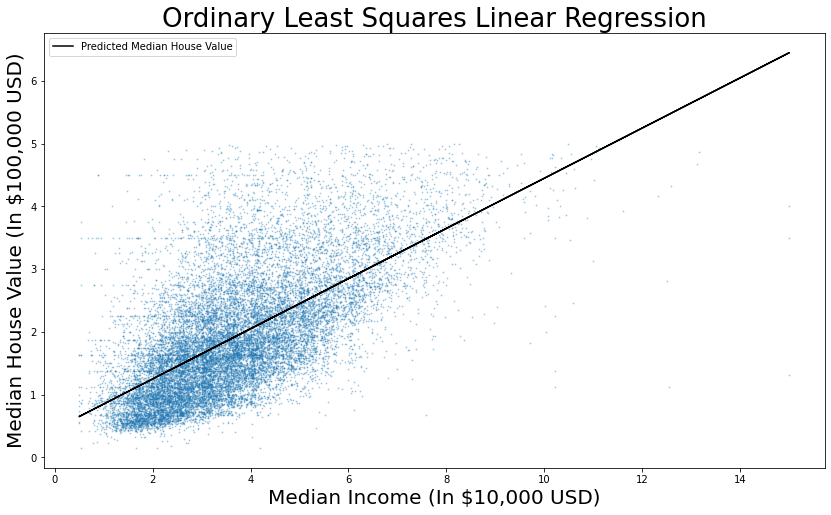

The Root Mean Squared Error of the above OLS Regression is: 0.7406728211387401


In [15]:
%matplotlib inline
y = np.array(trimmed_df['MedHouseVal']).reshape(-1, 1)
X = np.array(trimmed_df['MedInc']).reshape(-1,1)
lin_mod = linear_model.LinearRegression().fit(X, y)

y_pred = lin_mod.predict(X)
plt.figure(figsize = (14, 8))
plt.scatter(X, y, s = 0.75, alpha = 0.3)
plt.plot(X, y_pred, color = 'k', label = "Predicted Median House Value")
plt.legend()
plt.title("Ordinary Least Squares Linear Regression", fontsize = 26)
plt.xlabel("Median Income (In $10,000 USD)", fontsize = 20)
plt.ylabel("Median House Value (In $100,000 USD)", fontsize = 20)
plt.show()

OLS_RMSE = mean_squared_error(y_true = y, y_pred = y_pred, squared = False)
print("The Root Mean Squared Error of the above OLS Regression is:", OLS_RMSE)

### Here we have a scatterplot of our true median incomes vs median house values with our OLS regression as a black line. The Root Mean Squared Error is shown below. This doesn't mean much to us yet, but we will use it as a comparison metric between different types of regression. 

# Multiple Linear Regression ------------------------------------------------------------------------

### Multiple linear regression requires the relationship between the independent and dependent variables to be linear. This assumption can be tested with scatterplots.

C:\Users\mucha\AppData\Local\Temp/ipykernel_1100/330003112.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


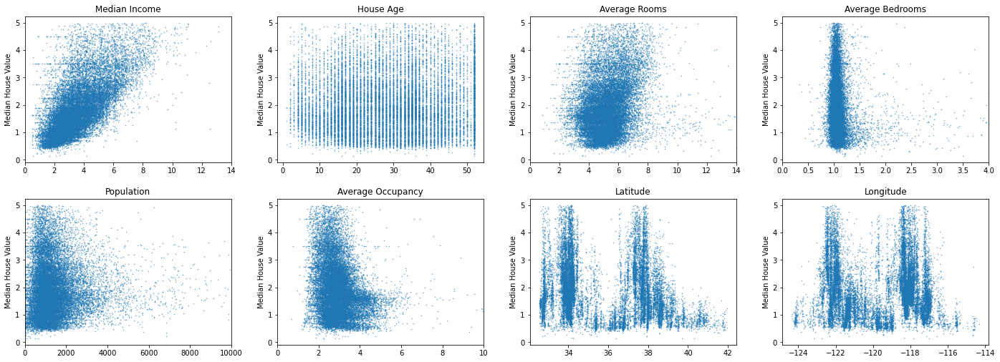

In [16]:
%matplotlib inline
fig, ax = plt.subplots(2,4, figsize = (10, 3))
fig.tight_layout(pad = 3, rect = (0, -0.5, 2, 2))

ax[0, 0].scatter(trimmed_df['MedInc'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[0, 0].set_title('Median Income')
ax[0, 0].set_ylabel('Median House Value')
ax[0, 0].set_xlim([0, 14])

ax[0, 1].scatter(trimmed_df['HouseAge'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[0, 1].set_title('House Age')
ax[0, 1].set_ylabel('Median House Value')

ax[0, 2].scatter(trimmed_df['AveRooms'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[0, 2].set_title('Average Rooms')
ax[0, 2].set_ylabel('Median House Value')
ax[0, 2].set_xlim([0, 14])

ax[0, 3].scatter(trimmed_df['AveBedrms'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[0, 3].set_title('Average Bedrooms')
ax[0, 3].set_ylabel('Median House Value')
ax[0, 3].set_xlim([0, 4])

ax[1, 0].scatter(trimmed_df['Population'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[1, 0].set_title('Population')
ax[1, 0].set_ylabel('Median House Value')
ax[1, 0].set_xlim([0, 10000])

ax[1, 1].scatter(trimmed_df['AveOccup'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[1, 1].set_title('Average Occupancy')
ax[1, 1].set_ylabel('Median House Value')
ax[1, 1].set_xlim([0, 10])

ax[1, 2].scatter(trimmed_df['Latitude'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[1, 2].set_title('Latitude')
ax[1, 2].set_ylabel('Median House Value')

ax[1, 3].scatter(trimmed_df['Longitude'], trimmed_df['MedHouseVal'], s = 0.5, alpha = 0.5)
ax[1, 3].set_title('Longitude')
ax[1, 3].set_ylabel('Median House Value')

fig.show()

### To call some of these relationships linear is a stretch, so I will check and see if all variables belong in the multiple linear regression using the statsmodel

In [17]:
X = trimmed_df.drop('MedHouseVal', axis=1)
y = trimmed_df['MedHouseVal']
def get_stats(X, y):
    results = sm.OLS(y, X).fit()
    print(results.summary())
get_stats(X, y)

                                 OLS Regression Results                                
Dep. Variable:            MedHouseVal   R-squared (uncentered):                   0.899
Model:                            OLS   Adj. R-squared (uncentered):              0.899
Method:                 Least Squares   F-statistic:                          2.193e+04
Date:                Thu, 13 Jan 2022   Prob (F-statistic):                        0.00
Time:                        13:17:15   Log-Likelihood:                         -20386.
No. Observations:               19648   AIC:                                  4.079e+04
Df Residuals:                   19640   BIC:                                  4.085e+04
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

### All p-values are below 0.05, so we will proceed with our multiple linear regression including all variables

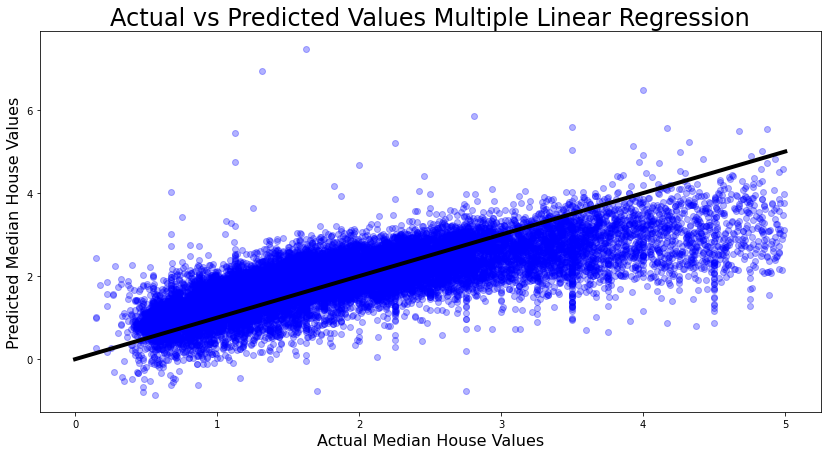

The Root Mean Squared Error of our Multiple Linear Regression is: 0.6336004752808959


In [18]:
mult_lin_reg = linear_model.LinearRegression()
fitted_mult_lin = mult_lin_reg.fit(X, y)
y_pred = fitted_mult_lin.predict(X)

x = np.linspace(0, 5)

plt.figure(figsize=(14, 7))
plt.scatter(x=y, y=y_pred, color="b", alpha = 0.3)
plt.title('Actual vs Predicted Values Multiple Linear Regression', fontsize = 24)
plt.xlabel('Actual Median House Values', fontsize = 16)
plt.ylabel('Predicted Median House Values', fontsize = 16)
plt.plot(x, x, linestyle='solid', color = 'k', linewidth=4)
plt.show()

multiple_linear_regression_RMSE = mean_squared_error(y_true = y, y_pred = y_pred, squared = False)
print("The Root Mean Squared Error of our Multiple Linear Regression is:", multiple_linear_regression_RMSE)

### As we can see above, the predicted values trended lower than the actual values, especially towards the higher values. Our RMSE is very, very slightly improved over our basic OLS model. 

# Ridge Regression ------------------------------------------------------------------------------------

### Ridge Regression is most commonly used when you have a very large number of predictor variables, even larger than the number of observations, but it is also commonly used when multicollinearity is present in your data. You can refer to the pandas profiling readout to see correlations between variables, but we are also going to check the variance inflation factor (VIF) of each dependent variable combo

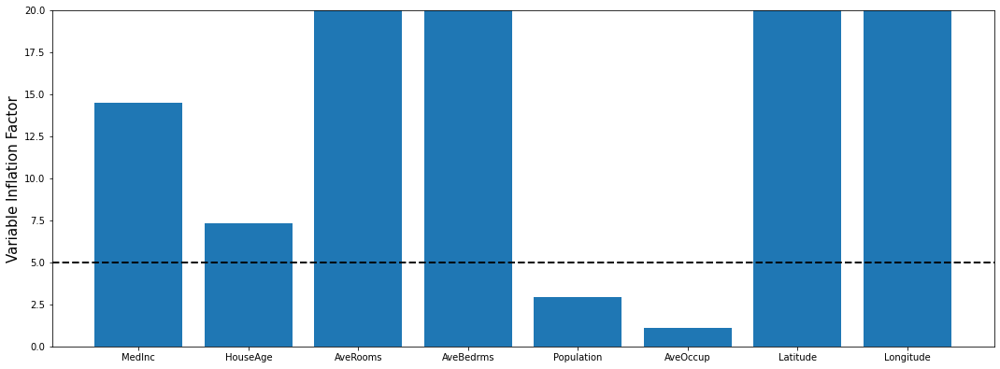

In [19]:
X = trimmed_df.drop("MedHouseVal", axis=1)
vif_df = pd.DataFrame()
vif_df['feature'] = X.columns
vif_df["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

fig = plt.figure(figsize = (14,5))
ax = fig.add_axes([0,0,1,1])
bars = vif_df['feature']
vif = vif_df['VIF']
ax.bar(bars, vif)
plt.ylabel("Variable Inflation Factor").set_size(15)
plt.ylim(0, 20)
plt.axhline(y = 5, linewidth = 2, linestyle = '--', color = 'k')
plt.show()

### Generally speaking, a VIF of above 5 indicates this variable is highly multicorrelated. This means that this variable is highly explained by other variables in the data. As you can see above, 6 of our 8 potential input variables have high VIF scores, some extremely high. This indicates our data set could benefit from a ridge regression. 

### Determining the optimal alpha value

In [20]:
X = trimmed_df.drop("MedHouseVal", axis=1)
y = trimmed_df['MedHouseVal']

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
model = linear_model.RidgeCV(alphas=np.arange(0, 5, 0.1), cv=cv, scoring='neg_root_mean_squared_error')
model.fit(X, y)
print('optimal alpha: %f' % model.alpha_)

optimal alpha: 4.900000


### Fitting the Ridge Regression

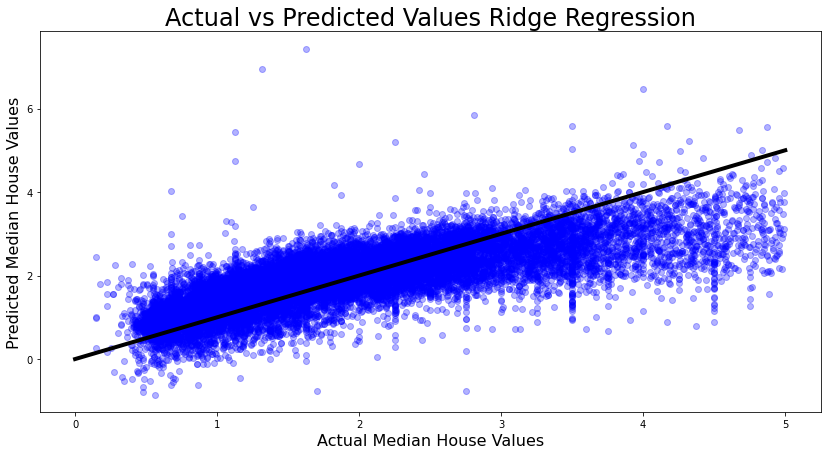

The Root Mean Squared Error of our Ridge Regression is: 0.6336011569397346


In [21]:
ridge_reg = linear_model.Ridge(alpha=model.alpha_)
ridge_reg_fit = ridge_reg.fit(X, y)
y_pred = ridge_reg_fit.predict(X)

x = np.linspace(0, 5)

plt.figure(figsize=(14, 7))
plt.scatter(x=y, y=y_pred, color="b", alpha = 0.3)
plt.title('Actual vs Predicted Values Ridge Regression', fontsize = 24)
plt.xlabel('Actual Median House Values', fontsize = 16)
plt.ylabel('Predicted Median House Values', fontsize = 16)
plt.plot(x, x, linestyle='solid', color = 'k', linewidth=4)
plt.show()

ridge_regression_RMSE = mean_squared_error(y_true = y, y_pred = y_pred, squared = False)
print("The Root Mean Squared Error of our Ridge Regression is:", ridge_regression_RMSE)

### This ridge regression results in a very similar RMSE to our Multiple Linear regression, so lets compare coefficients of the two models. 

In [22]:
ridge_reg_fit.coef_

array([ 4.30130814e-01,  8.06342346e-03, -1.07114246e-01,  5.96672552e-01,
        5.35709060e-06, -3.41569442e-03, -3.77262467e-01, -3.93342709e-01])

In [23]:
fitted_mult_lin.coef_

array([ 4.30748371e-01,  8.05927594e-03, -1.08123654e-01,  6.01834128e-01,
        5.32393694e-06, -3.41745507e-03, -3.77239803e-01, -3.93390283e-01])

### The coefficients are extremely similar, it seems despite the high VIF scores, no feature was heavily penalized

# Lasso Regression ------------------------------------------------------------------------------------

### Lasso regression is very similar to ridge regression, except lasso tends to make coefficients absolute zero, whereas ridge never sets a coefficient to zero. 

In [24]:
X = trimmed_df.drop("MedHouseVal", axis=1)
y = trimmed_df['MedHouseVal']

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
model = linear_model.LassoCV(alphas=None, cv=10, max_iter = 10000)
model.fit(X, y)
print('optimal alpha: %f' % model.alpha_)

optimal alpha: 0.015101


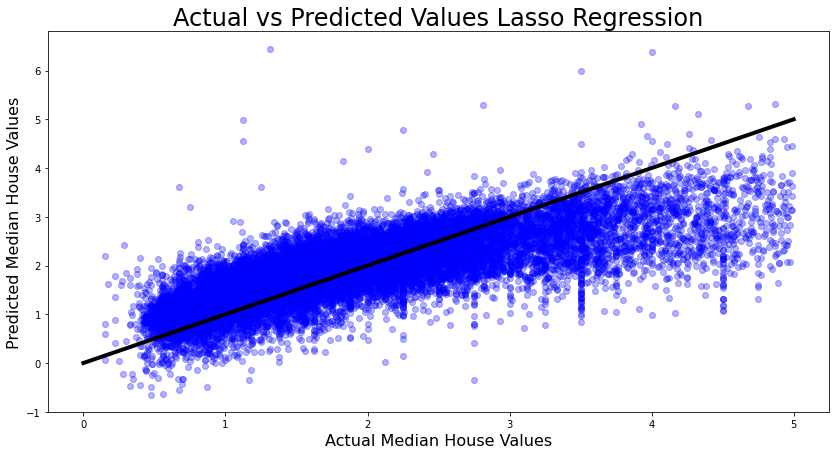

The Root Mean Squared Error of our Lasso Regression is: 0.6420329808745218


In [25]:
lasso_reg = linear_model.Lasso(alpha=model.alpha_)
lasso_reg_fit = lasso_reg.fit(X, y)
y_pred = lasso_reg_fit.predict(X)

x = np.linspace(0, 5)

plt.figure(figsize=(14, 7))
plt.scatter(x=y, y=y_pred, color="b", alpha = 0.3)
plt.title('Actual vs Predicted Values Lasso Regression', fontsize = 24)
plt.xlabel('Actual Median House Values', fontsize = 16)
plt.ylabel('Predicted Median House Values', fontsize = 16)
plt.plot(x, x, linestyle='solid', color = 'k', linewidth=4)
plt.show()

lasso_regression_RMSE = mean_squared_error(y_true = y, y_pred = y_pred, squared = False)
print("The Root Mean Squared Error of our Lasso Regression is:", lasso_regression_RMSE)

### The Lasso regression had a very similar RMSE score to the Ridge regression, which makes sense as they are very similar models. 

# Kernel Regression -----------------------------------------------------------------------------------

### The first step in Kernel Regression is figuring out which kernel is best fitted with the data. 
#### The data used for this step: 
####    - MedInc
####    - MedHouseVal

### Below, each type of kernel is tested with its corresponding root mean squared error returned. The kernel resulting in the lowest root mean squared error is chosen for further tuning.

In [26]:
X = np.array(trimmed_df['MedInc']).reshape(-1, 1)
y = trimmed_df['MedHouseVal']

krr1 = KernelRidge(degree = 2, kernel='linear')
krr1.fit(X, y)
pred1 = krr1.predict(X)
print("Kernel Ridge with linear results in RMSE of ", np.sqrt(mean_squared_error(pred1, y)))

krr2 = KernelRidge(degree = 2, kernel='rbf')
krr2.fit(X, y)
pred2 = krr2.predict(X)
print("Kernel Ridge with rbf results in RMSE of ", np.sqrt(mean_squared_error(pred2, y)))

krr3 = KernelRidge(degree = 2, kernel='polynomial')
krr3.fit(X, y)
pred3 = krr3.predict(X)
print("Kernel Ridge with polynomial results in RMSE of ", np.sqrt(mean_squared_error(pred3, y)))

krr4 = KernelRidge(degree = 2, kernel='laplacian')
krr4.fit(X, y)
pred4 = krr4.predict(X)
print("Kernel Ridge with laplacian results in RMSE of ", np.sqrt(mean_squared_error(pred4, y)))

krr5 = KernelRidge(degree = 2, kernel='cosine')
krr5.fit(X, y)
pred5 = krr5.predict(X)
print("Kernel Ridge with cosine results in RMSE of ", np.sqrt(mean_squared_error(pred5, y)))

Kernel Ridge with linear results in RMSE of  0.7615210776672706
Kernel Ridge with rbf results in RMSE of  0.7354352618342224
Kernel Ridge with polynomial results in RMSE of  0.7403493901684473
Kernel Ridge with laplacian results in RMSE of  0.7273600477616334
Kernel Ridge with cosine results in RMSE of  0.9710838419270943


### The kernel with the lowest root mean squared error is Laplacian. 

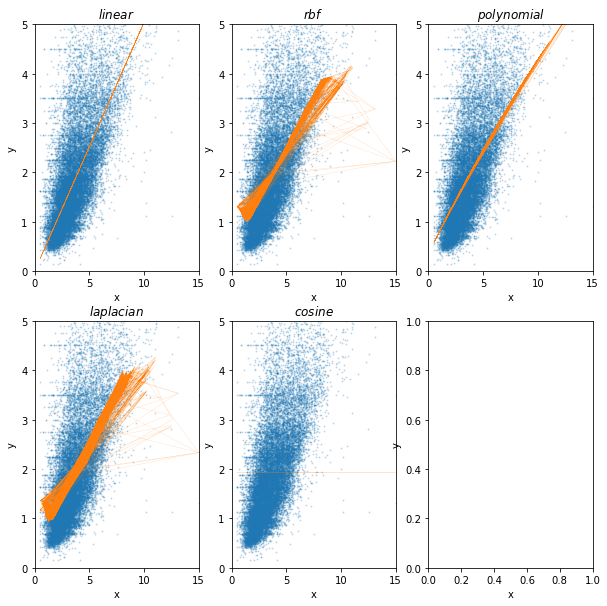

In [27]:
%matplotlib inline
#Plot each kernel 

fig, axs = plt.subplots(2, 3, figsize = (10, 10))
for ax in axs.flat:
    ax.set(xlabel='x', ylabel='y')

#subplot top-left
axs[0, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 0].plot(X,pred1, linewidth=.1, color='C1')
axs[0, 0].set_title(r'$linear$')
axs[0, 0].set_xlim(0,15)
axs[0, 0].set_ylim(0,5)

#subplot top-middle
axs[0, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 1].plot(X,pred2, linewidth=.1, color='C1')
axs[0, 1].set_title(r'$rbf$')
axs[0, 1].set_xlim(0,15)
axs[0, 1].set_ylim(0,5)

#subplot top-right
axs[0, 2].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 2].plot(X,pred3, linewidth=.1, color='C1')
axs[0, 2].set_title(r'$polynomial$')
axs[0, 2].set_xlim(0,15)
axs[0, 2].set_ylim(0,5)

#subplot bottom-left
axs[1, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 0].plot(X,pred4, linewidth=.1, color='C1')
axs[1, 0].set_title(r'$laplacian$')
axs[1, 0].set_xlim(0,15)
axs[1, 0].set_ylim(0,5)

#subplot bottom-middle
axs[1, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 1].plot(X,pred5, linewidth=.1, color='C1')
axs[1, 1].set_title(r'$cosine$')
axs[1, 1].set_xlim(0,15)
axs[1, 1].set_ylim(0,5)

plt.show()

### Before proceeding with kernel regression with the laplacian kernel, we will check to see if a larger degree associated with the polynomial kernel returns a better root mean squared error. A simple loop will display the root mean squared errors for polynomial degrees of 2, 3, 4, and 5. 

In [28]:
X = np.array(trimmed_df['MedInc']).reshape(-1, 1)
y = trimmed_df['MedHouseVal']
pred_list = []
for d in [2, 3, 4, 5]:
    krr = KernelRidge(degree = d, kernel='polynomial')
    krr.fit(X, y)
    pred = krr.predict(X)
    pred_list.append(pred)
    print("Kernel Ridge with degree ", d, " results in RMSE of ", np.sqrt(mean_squared_error(pred, y)))
    

Kernel Ridge with degree  2  results in RMSE of  0.7403493901684473
Kernel Ridge with degree  3  results in RMSE of  0.7377264076896372
Kernel Ridge with degree  4  results in RMSE of  0.7377264528723216
Kernel Ridge with degree  5  results in RMSE of  0.7377086361857631


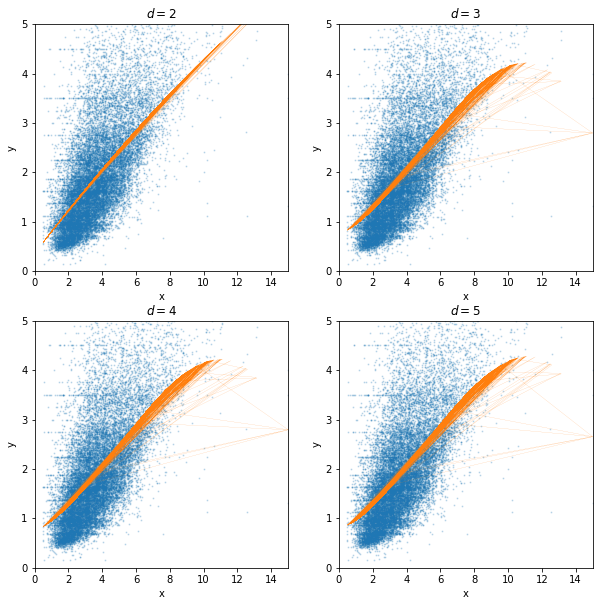

In [29]:
fig, axs = plt.subplots(2, 2, figsize = (10, 10))
for ax in axs.flat:
    ax.set(xlabel='x', ylabel='y')

# Subplot top-left
axs[0, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 0].plot(X,pred_list[0],linewidth=.1, color='C1')
axs[0, 0].set_title(r'$d = 2$')
axs[0, 0].set_xlim(0,15)
axs[0, 0].set_ylim(0,5)

# Subplot top-right
axs[0, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 1].plot(X,pred_list[1], linewidth=.1, color='C1')
axs[0, 1].set_title(r'$d = 3$')
axs[0, 1].set_xlim(0,15)
axs[0, 1].set_ylim(0,5)

# Subplot bottom-left
axs[1, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 0].plot(X,pred_list[2], linewidth=.1, color='C1')
axs[1, 0].set_title(r'$d = 4$')
axs[1, 0].set_xlim(0,15)
axs[1, 0].set_ylim(0,5)

# Subplot bottom-right
axs[1, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 1].plot(X,pred_list[3], linewidth=.1, color='C1')
axs[1, 1].set_title(r'$d = 5$')
axs[1, 1].set_xlim(0,15)
axs[1, 1].set_ylim(0,5)

plt.show()

### It appears there is no significant improvement in using a polynomial kernel so the regression will continue using the laplacian kernel.

### Here, we adjust the alpha value for laplacian kernel regression. The alpha value represents the strength of regularization present. The different alpha values tested are 0.0001, 0.01, 1.0, 10.0, and 100.0. The alpha that results in the lowest root mean squared error will result in the final kernel regression plot. 

In [30]:
X = np.array(trimmed_df['MedInc']).reshape(-1, 1)
y = trimmed_df['MedHouseVal']
final_pred_list = []

for a in [0.0001, 0.01, 1.0, 10.0, 100.0]:
    krr = KernelRidge(alpha = a, kernel = 'laplacian')
    krr.fit(X, y)
    pred = krr.predict(X)
    final_pred_list.append(pred)
    print("Kernel Ridge with alpha ", a, " results in RMSE of ", np.sqrt(mean_squared_error(pred, y)))

Kernel Ridge with alpha  0.0001  results in RMSE of  0.47506406234771065
Kernel Ridge with alpha  0.01  results in RMSE of  0.6695185963195661
Kernel Ridge with alpha  1.0  results in RMSE of  0.7273600477616334
Kernel Ridge with alpha  10.0  results in RMSE of  0.73594460406154
Kernel Ridge with alpha  100.0  results in RMSE of  0.7628564954470426


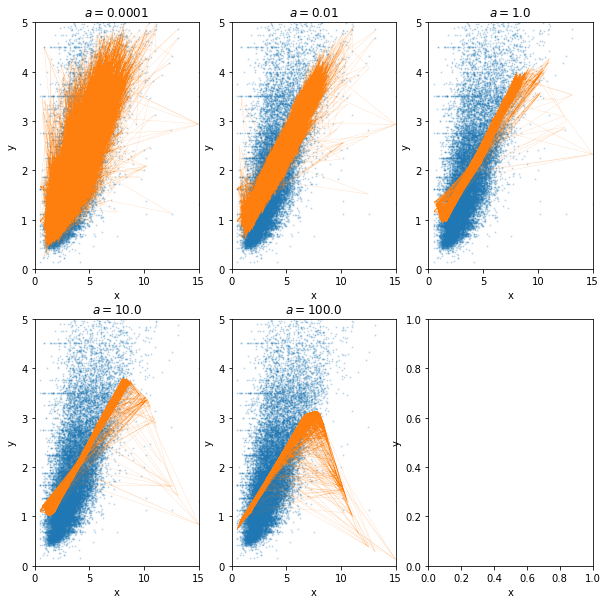

In [31]:
%matplotlib inline

fig, axs = plt.subplots(2, 3, figsize = (10, 10))
for ax in axs.flat:
    ax.set(xlabel='x', ylabel='y')

#subplot top-left
axs[0, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 0].plot(X,final_pred_list[0], linewidth=.1, color='C1')
axs[0, 0].set_title(r'$a = 0.0001$')
axs[0, 0].set_xlim(0,15)
axs[0, 0].set_ylim(0,5)

#subplot top-middle
axs[0, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 1].plot(X,final_pred_list[1], linewidth=.1, color='C1')
axs[0, 1].set_title(r'$a = 0.01$')
axs[0, 1].set_xlim(0,15)
axs[0, 1].set_ylim(0,5)

#subplot top-right
axs[0, 2].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[0, 2].plot(X,final_pred_list[2], linewidth=.1, color='C1')
axs[0, 2].set_title(r'$a = 1.0$')
axs[0, 2].set_xlim(0,15)
axs[0, 2].set_ylim(0,5)

#subplot bottom-left
axs[1, 0].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 0].plot(X,final_pred_list[3], linewidth=.1, color='C1')
axs[1, 0].set_title(r'$a = 10.0$')
axs[1, 0].set_xlim(0,15)
axs[1, 0].set_ylim(0,5)

#subplot bottom-middle
axs[1, 1].scatter(X, y, 1, color='C0', alpha = 0.2)
axs[1, 1].plot(X,final_pred_list[4], linewidth=.1, color='C1')
axs[1, 1].set_title(r'$a = 100.0$')
axs[1, 1].set_xlim(0,15)
axs[1, 1].set_ylim(0,5)

plt.show()

### Here, it is shown that a smaller alpha value results in a better root mean squared error. 

### Thus, the final kernel regression plot is Laplacian Kernel Regression with a 0.0001 regularization strength.

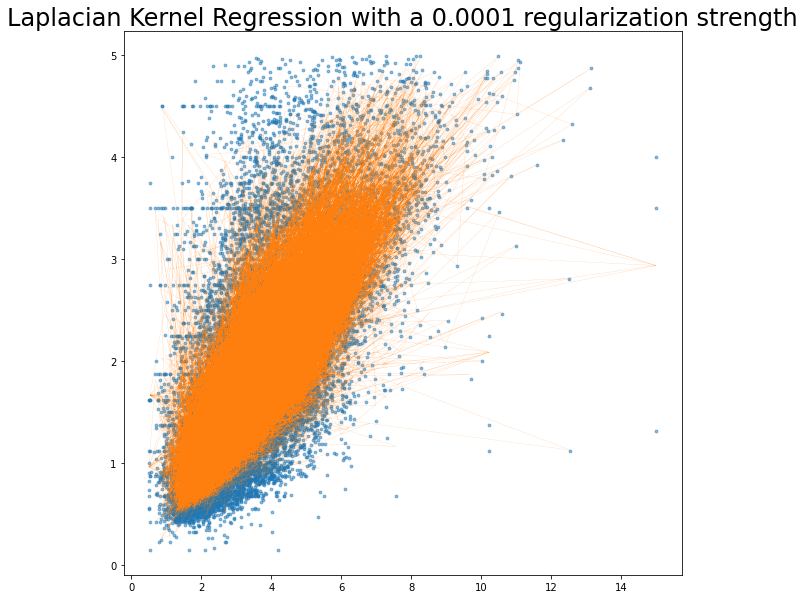

In [32]:
kernel_reg_RMSE = 0.47422550575004435

plt.figure(figsize=(10, 10))
plt.scatter(X, y, 8, color='C0', alpha = 0.5)
plt.plot(X,final_pred_list[0], linewidth=.1, color='C1')
plt.title('Laplacian Kernel Regression with a 0.0001 regularization strength', fontsize = 24)
plt.show()

# Bayesian Ridge Regression ----------------------------------------------------------------------

### Bayesian ridge regression estimates a probabilistic model of the regression problem

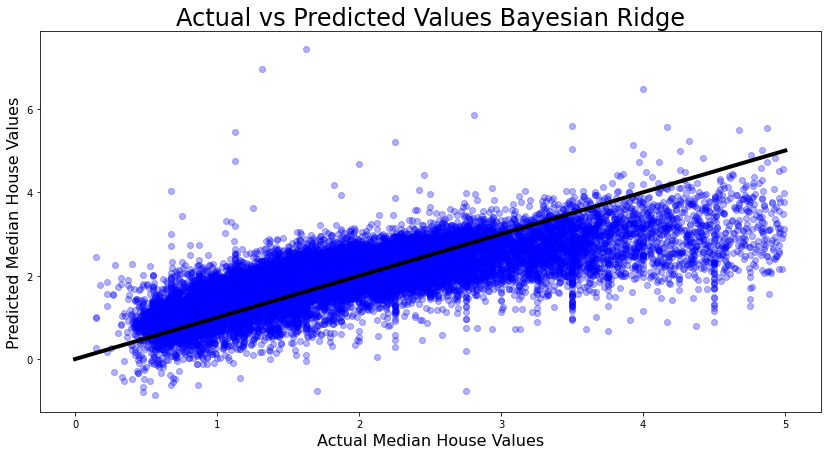

The Root Mean Squared Error of our Bayesian Ridge Regression is: 0.6420329808745218


In [33]:
X1 = trimmed_df.drop('MedHouseVal', axis=1)
y1 = trimmed_df['MedHouseVal']
bay_ridge = BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, compute_score=False, copy_X=True,
        fit_intercept=True, lambda_1=1e-06, lambda_2=1e-06, n_iter=300,
        tol=0.001, verbose=False)
result = bay_ridge.fit(X1,y1)
ypred1 = result.predict(X1)

x = np.linspace(0, 5)

plt.figure(figsize=(14, 7))
plt.scatter(x=y1, y=ypred1, color="b", alpha = 0.3)
plt.title('Actual vs Predicted Values Bayesian Ridge', fontsize = 24)
plt.xlabel('Actual Median House Values', fontsize = 16)
plt.ylabel('Predicted Median House Values', fontsize = 16)
plt.plot(x, x, linestyle='solid', color = 'k', linewidth=4)
plt.show()

bayesian_ridge_regression_RMSE = mean_squared_error(y_true = y1, y_pred = y_pred, squared = False)
print("The Root Mean Squared Error of our Bayesian Ridge Regression is:", bayesian_ridge_regression_RMSE)

# Comparing the Models------------------------------------------------------------------------------

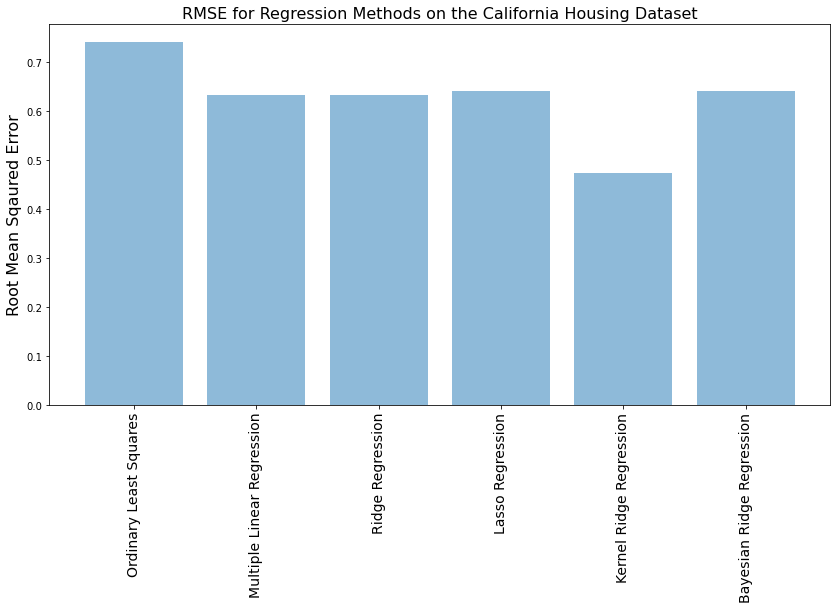

In [34]:
rmses = [OLS_RMSE, multiple_linear_regression_RMSE, ridge_regression_RMSE, lasso_regression_RMSE, kernel_reg_RMSE, bayesian_ridge_regression_RMSE]
names = ["Ordinary Least Squares", "Multiple Linear Regression", "Ridge Regression", "Lasso Regression", "Kernel Ridge Regression", "Bayesian Ridge Regression"]
y_pos = np.arange(len(rmses))

plt.figure(figsize=(14, 7))
plt.bar(y_pos, rmses, align='center', alpha=0.5)
plt.xticks(y_pos, names, rotation = 90, fontsize=14)
plt.ylabel('Root Mean Sqaured Error', fontsize = 16)
plt.title('RMSE for Regression Methods on the California Housing Dataset', fontsize=16)

plt.show()

### As we can see here, Kernel Ridge Regression resulted in the best RMSE value, and therefore theoretically the best fit model for our data. 